In [1]:
import rospy
from sensor_msgs.msg import Image
from cv_bridge import CvBridge
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from std_msgs.msg import Float64
from dynamixel_sdk import *
import datetime
import threading
import serial
import re
import pandas as pd
import glob


In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 44em; }</style>"))

/tmp/ipykernel_38262/2284580335.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [3]:
%%javascript

window.scroll_flag = true
window.scroll_exit = false
window.scroll_delay = 100

$(".output_scroll").each(function() {
    $(this)[0].scrollTop = $(this)[0].scrollHeight;
});

function callScrollToBottom() {
    setTimeout(scrollToBottom, window.scroll_delay);
}

function scrollToBottom() {
    if (window.scroll_exit) {
        return;
    }
    if (!window.scroll_flag) {
        callScrollToBottom();
        return;
    };
    
    $(".output_scroll").each(function() {
        if (!$(this).attr('scroll_checkbox')){
            window.scroll_flag = true;
            $(this).attr('scroll_checkbox',true);
            var div = document.createElement('div');
            var checkbox = document.createElement('input');
            checkbox.type = "checkbox";
            checkbox.onclick = function(){window.scroll_flag = checkbox.checked}
            checkbox.checked = "checked"
            div.append("Auto-Scroll-To-Bottom: ");
            div.append(checkbox);
            $(this).parent().before(div);
        }
        
        $(this)[0].scrollTop = $(this)[0].scrollHeight;
    });
    callScrollToBottom();
}
scrollToBottom();

<IPython.core.display.Javascript object>

In [4]:
class Dynamixel_motor:
    def __init__(self, dxl_id, baudrate, device_name):
        self.dxl_id = dxl_id
        self.baudrate = baudrate
        self.device_name = device_name
        self.protocol_version = 2.0

        # Initialize PortHandler instance
        # Set the port path
        # Get methods and members of PortHandlerLinux or PortHandlerWindows
        self.portHandler = PortHandler(self.device_name)

        # Initialize PacketHandler instance
        # Set the protocol version
        # Get methods and members of Protocol1PacketHandler or Protocol2PacketHandler
        self.packetHandler = PacketHandler(self.protocol_version)

        # Open port
        if self.portHandler.openPort():
            print("Succeeded to open the port")
        else:
            print("Failed to open the port")
            print("Press any key to terminate...")
            self.close_port()

        # Set port baudrate
        if self.portHandler.setBaudRate(self.baudrate):
            print("Succeeded to change the baudrate")
        else:
            print("Failed to change the baudrate")
            print("Press any key to terminate...")
            self.close_port()

    def __del__(self):
        print('Destructor called.')
        self.portHandler.closePort()

    def close_port(self):
        self.torque_disable()
        self.portHandler.closePort()
        print('closing port.')

    def ping_motor(self):

        # Try to ping the Dynamixel
        # Get Dynamixel model number
        dxl_model_number, dxl_comm_result, dxl_error = self.packetHandler.ping(self.portHandler, self.dxl_id)
        print(f"dxl_model_number is: {dxl_model_number}")
        print(f"dxl_comm_result is: {dxl_comm_result}")
        print(f"dxl_error is: {dxl_error}")
        print(f"COMM_SUCCESS is {COMM_SUCCESS}")
        if dxl_comm_result != COMM_SUCCESS:
            print("statement 0")
            print("%s" % self.packetHandler.getTxRxResult(dxl_comm_result))
            self.close_port()
        elif dxl_error != 0:
            print("statement 1")
            print("%s" % self.packetHandler.getRxPacketError(dxl_error))
            self.close_port()
        else:
            print("statement 2")
            print("[ID:%03d] ping Succeeded. Dynamixel model number : %d" % (self.dxl_id, dxl_model_number))

    def torque_enable(self):
        TORQUE_ENABLE_REG = 64
        TORQUE_ENABLE = 1
        result, error = self.packetHandler.write4ByteTxRx(self.portHandler, self.dxl_id, TORQUE_ENABLE_REG, TORQUE_ENABLE)
        return

    def torque_disable(self):
        TORQUE_ENABLE_REG = 64
        TORQUE_ENABLE = 0
        result, error = self.packetHandler.write4ByteTxRx(self.portHandler, self.dxl_id, TORQUE_ENABLE_REG, TORQUE_ENABLE)
        return

    def read_operation_mode(self):
        OPERATING_MODE_REG = 11
        data, result, error = self.packetHandler.read1ByteTxRx(self.portHandler, self.dxl_id, OPERATING_MODE_REG)
        print(f"data is: {data}")
        print(f"result is: {result}")
        print(f"error is: {error}")
        return data

    def set_current_position_mode(self):
        OPERATING_MODE_REG = 11
        OPERATION_MODE = 5
        result, error = self.packetHandler.write1ByteTxRx(self.portHandler, self.dxl_id, OPERATING_MODE_REG, OPERATION_MODE)
        return

    def set_goal_current(self, GOAL_CURRENT):
        GOAL_CURRENT_REG = 102
        result, error = self.packetHandler.write2ByteTxRx(self.portHandler, self.dxl_id, GOAL_CURRENT_REG, GOAL_CURRENT)
        return

    def read_present_position(self):
        PRESENT_POSITION_REG = 132
        PRESENT_POSITION, result, error = self.packetHandler.read4ByteTxRx(self.portHandler, self.dxl_id, PRESENT_POSITION_REG)
        return PRESENT_POSITION

    def set_goal_position(self, GOAL_POSITION):
        GOAL_POSITION_REG = 116
        result, error = self.packetHandler.write4ByteTxRx(self.portHandler, self.dxl_id, GOAL_POSITION_REG, GOAL_POSITION)
        return

    def read_present_current(self):
        PRESENT_CURRENT_REG = 126
        PRESENT_CURRENT, result, error = self.packetHandler.read2ByteTxRx(self.portHandler, self.dxl_id, PRESENT_CURRENT_REG)
        return PRESENT_CURRENT


Succeeded to open the port
Succeeded to change the baudrate
data is: 5
result is: 0
error is: 0
Taring load cell...
[INFO] [1677531779.150201]: Timing images
Enter something: 
b'000.0,000.0,0409.8,0409.3\r\n'
[INFO] [1677531792.009220]: Image received...


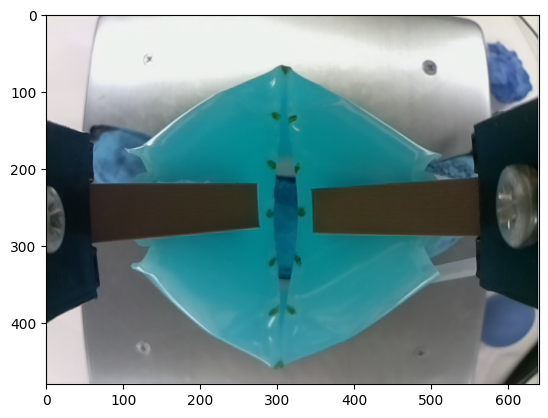

b'024.0,053.4,0441.9,0441.4\r\n'
Data number 1
['024.0', '053.4', '0441.9', '0441.4']
b'009.4,045.1,0579.6,0333.0\r\n'
['009.4', '045.1', '0579.6', '0333.0']
Enter something: 
b'000.0,000.0,0381.0,0380.5\r\n'
[INFO] [1677531804.278764]: Image received...


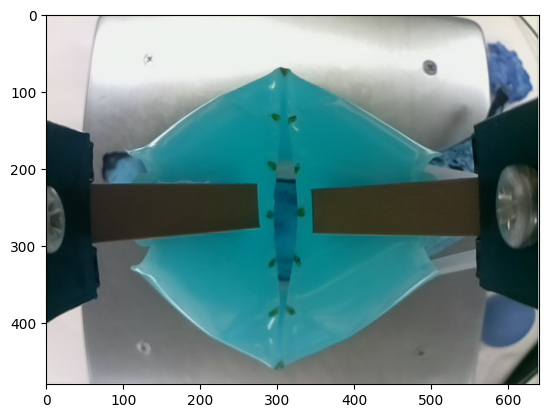

b'027.9,058.3,0430.8,0430.0\r\n'
Data number 2
['027.9', '058.3', '0430.8', '0430.0']
b'013.4,051.0,0569.7,0322.6\r\n'
['013.4', '051.0', '0569.7', '0322.6']
Enter something: 
b'000.0,000.0,0378.3,0378.2\r\n'
[INFO] [1677531816.787051]: Image received...


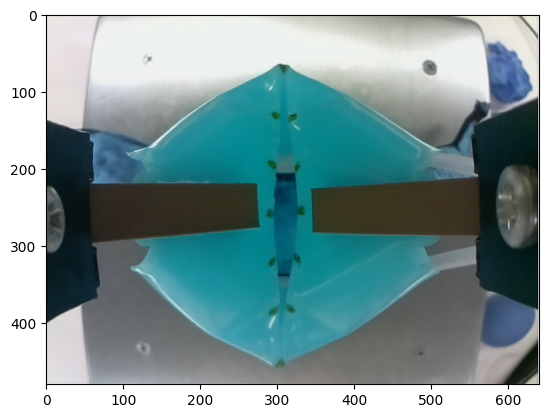

b'026.0,047.2,0435.6,0435.3\r\n'
Data number 3
['026.0', '047.2', '0435.6', '0435.3']
b'017.1,040.2,0573.8,0326.8\r\n'
['017.1', '040.2', '0573.8', '0326.8']
Enter something: 
b'000.0,000.0,0375.6,0375.4\r\n'
[INFO] [1677531829.283199]: Image received...


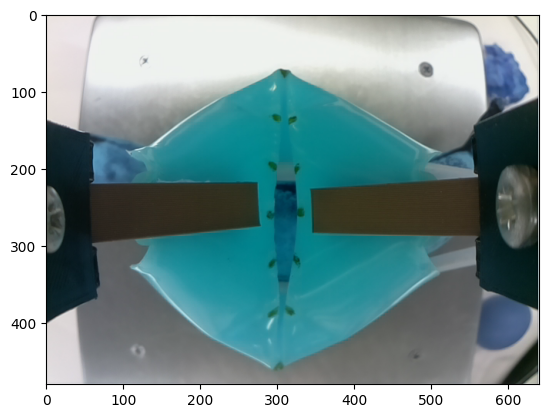

b'030.9,073.7,0423.6,0423.7\r\n'
Data number 4
['030.9', '073.7', '0423.6', '0423.7']
b'018.0,065.7,0564.2,0317.2\r\n'
['018.0', '065.7', '0564.2', '0317.2']
Enter something: 
b'000.0,000.0,0373.8,0373.6\r\n'
[INFO] [1677531841.275145]: Image received...


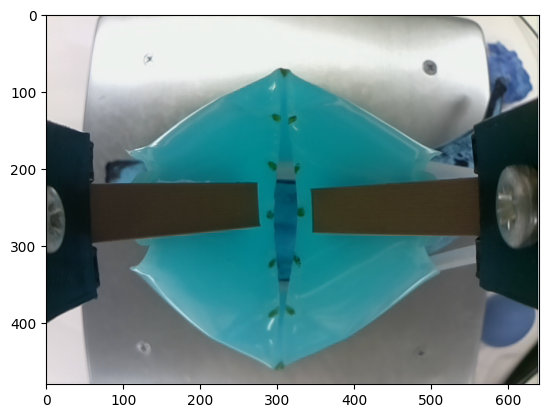

b'027.2,056.5,0425.5,0425.1\r\n'
Data number 5
['027.2', '056.5', '0425.5', '0425.1']
b'018.0,050.7,0562.8,0316.0\r\n'
['018.0', '050.7', '0562.8', '0316.0']
Enter something: 
b'000.0,000.0,0379.1,0379.0\r\n'
[INFO] [1677531857.755219]: Image received...


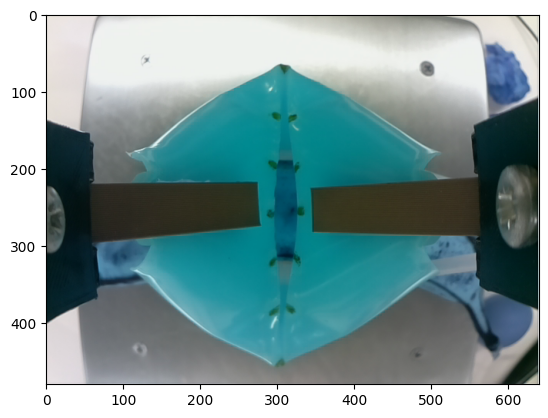

b'043.6,021.3,0427.3,0426.4\r\n'
Data number 6
['043.6', '021.3', '0427.3', '0426.4']
b'041.3,016.6,0563.3,0316.7\r\n'
['041.3', '016.6', '0563.3', '0316.7']
Enter something: 
b'000.0,000.0,0372.6,0372.6\r\n'
[INFO] [1677531869.777589]: Image received...


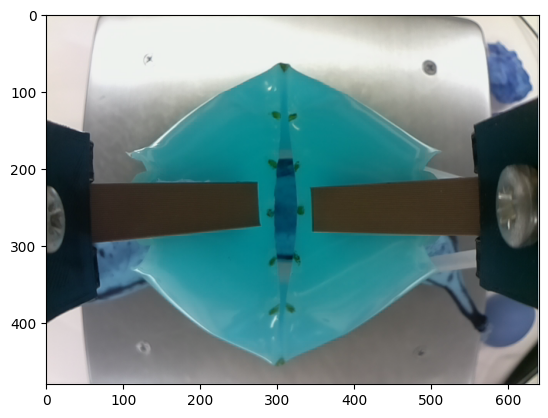

b'038.8,023.2,0429.5,0428.1\r\n'
Data number 7
['038.8', '023.2', '0429.5', '0428.1']
b'036.6,016.0,0565.2,0318.5\r\n'
['036.6', '016.0', '0565.2', '0318.5']
Enter something: 
b'000.0,000.0,0365.2,0366.5\r\n'
[INFO] [1677531881.525446]: Image received...


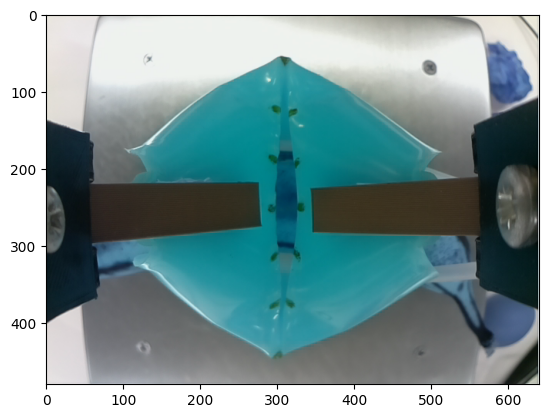

b'037.7,034.4,0420.1,0419.8\r\n'
Data number 8
['037.7', '034.4', '0420.1', '0419.8']
b'036.0,023.3,0559.9,0313.3\r\n'
['036.0', '023.3', '0559.9', '0313.3']
Enter something: 
b'000.0,000.0,0367.0,0367.6\r\n'
[INFO] [1677531893.281336]: Image received...


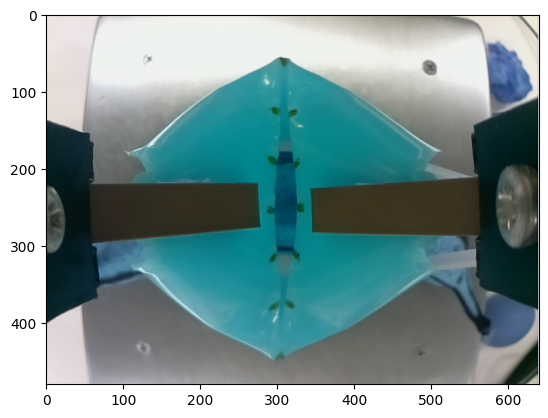

b'039.1,023.1,0426.5,0425.8\r\n'
Data number 9
['039.1', '023.1', '0426.5', '0425.8']
b'036.0,016.5,0563.8,0316.9\r\n'
['036.0', '016.5', '0563.8', '0316.9']
Enter something: 
b'000.0,000.0,0366.6,0367.0\r\n'
[INFO] [1677531905.273696]: Image received...


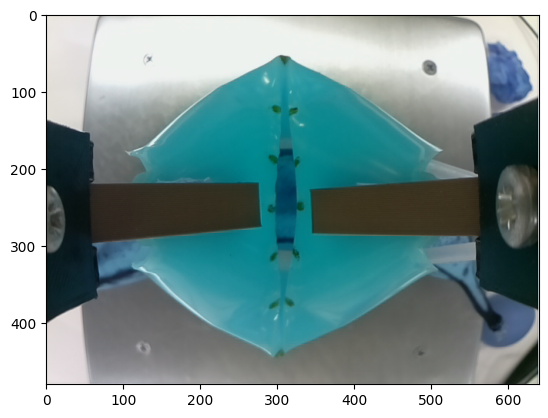

b'046.0,029.2,0420.1,0419.2\r\n'
Data number 10
['046.0', '029.2', '0420.1', '0419.2']
b'043.0,022.6,0558.2,0311.3\r\n'
['043.0', '022.6', '0558.2', '0311.3']
Enter something: 
b'000.0,000.0,0371.6,0371.9\r\n'
[INFO] [1677531920.031839]: Image received...


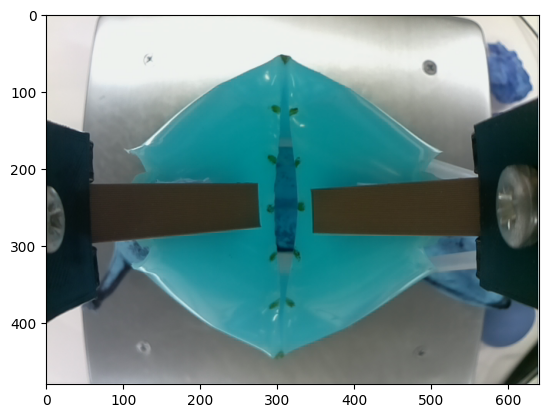

b'025.9,023.0,0434.3,0433.5\r\n'
Data number 11
['025.9', '023.0', '0434.3', '0433.5']
b'022.2,016.0,0569.5,0322.8\r\n'
['022.2', '016.0', '0569.5', '0322.8']
Enter something: 
b'000.0,000.0,0366.5,0366.5\r\n'
[INFO] [1677531932.274020]: Image received...


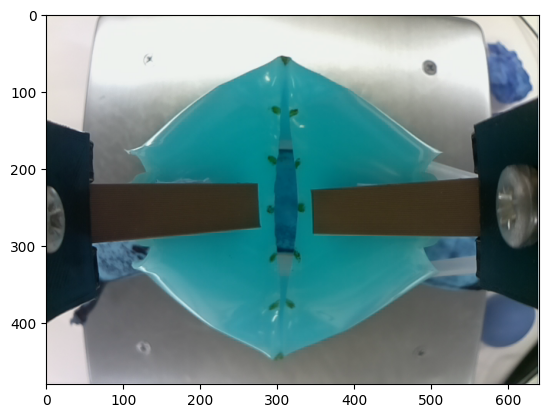

b'024.9,026.0,0435.6,0435.9\r\n'
Data number 12
['024.9', '026.0', '0435.6', '0435.9']
b'023.3,017.8,0571.6,0324.6\r\n'
['023.3', '017.8', '0571.6', '0324.6']
Enter something: 
b'000.0,000.0,0364.4,0365.1\r\n'
[INFO] [1677531944.280106]: Image received...


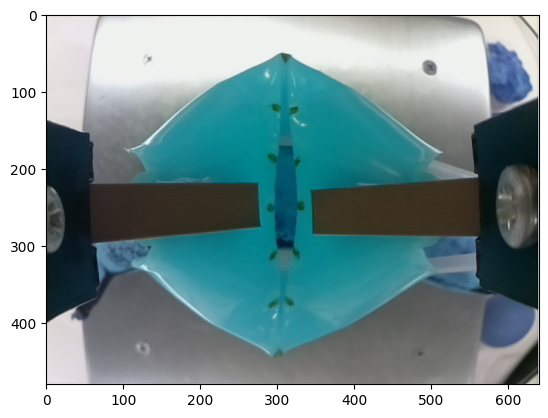

b'029.4,031.4,0429.4,0428.9\r\n'
Data number 13
['029.4', '031.4', '0429.4', '0428.9']
b'025.9,021.8,0567.0,0320.3\r\n'
['025.9', '021.8', '0567.0', '0320.3']
Enter something: 
b'000.0,000.0,0362.9,0363.2\r\n'
[INFO] [1677531956.020240]: Image received...


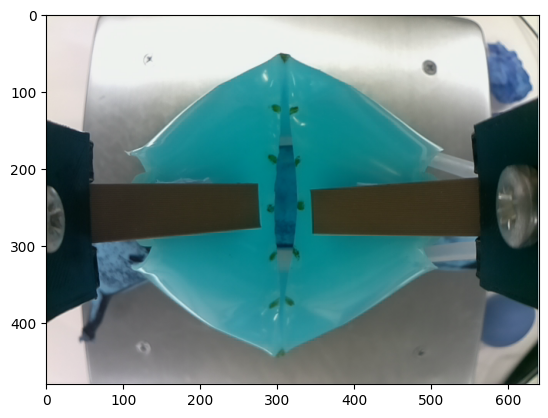

b'028.1,032.7,0430.0,0429.0\r\n'
Data number 14
['028.1', '032.7', '0430.0', '0429.0']
b'026.3,022.3,0567.4,0320.2\r\n'
['026.3', '022.3', '0567.4', '0320.2']
Enter something: 
b'000.0,000.0,0363.0,0363.3\r\n'
[INFO] [1677531968.002400]: Image received...


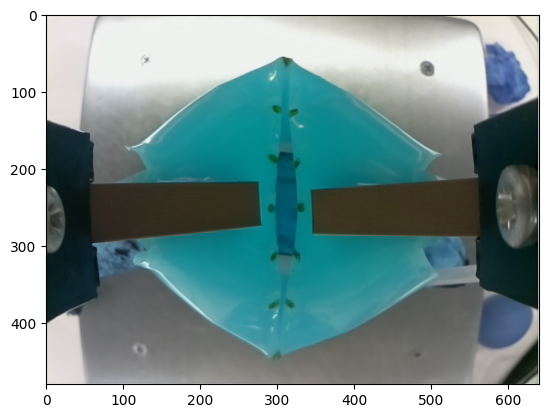

b'034.7,036.5,0421.8,0421.5\r\n'
Data number 15
['034.7', '036.5', '0421.8', '0421.5']
b'043.5,026.9,0552.8,0306.2\r\n'
['043.5', '026.9', '0552.8', '0306.2']
Enter something: 
b'000.0,000.0,0370.1,0370.3\r\n'
[INFO] [1677531982.527404]: Image received...


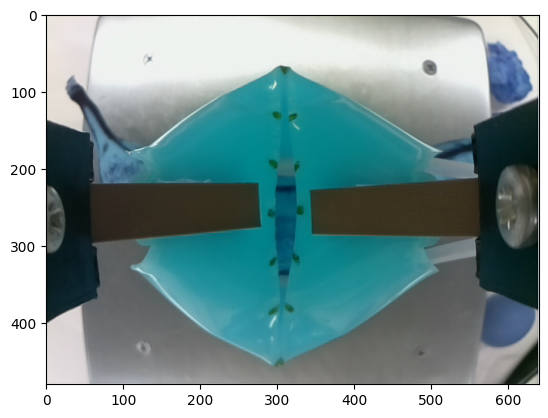

b'034.1,081.2,0413.8,0412.4\r\n'
Data number 16
['034.1', '081.2', '0413.8', '0412.4']
b'025.7,076.8,0552.0,0305.0\r\n'
['025.7', '076.8', '0552.0', '0305.0']
Enter something: 
b'000.0,000.0,0365.9,0365.7\r\n'
[INFO] [1677531994.523316]: Image received...


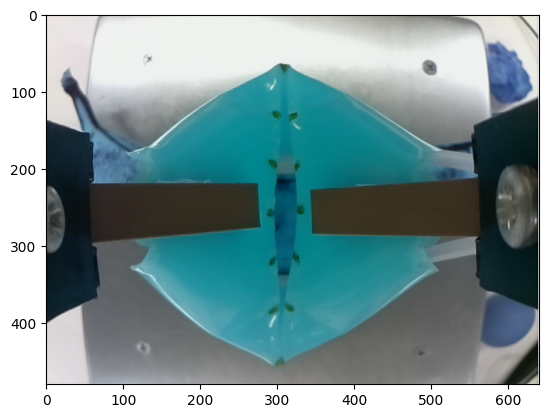

b'028.6,065.2,0422.9,0423.3\r\n'
Data number 17
['028.6', '065.2', '0422.9', '0423.3']
b'023.7,059.6,0560.7,0313.8\r\n'
['023.7', '059.6', '0560.7', '0313.8']
Enter something: 
b'000.0,000.0,0366.6,0366.8\r\n'
[INFO] [1677532006.525141]: Image received...


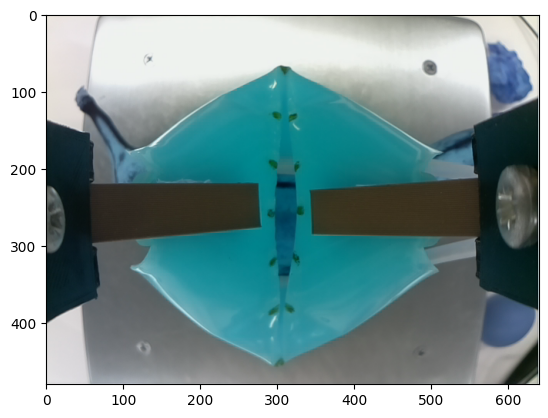

b'035.6,078.6,0415.0,0413.9\r\n'
Data number 18
['035.6', '078.6', '0415.0', '0413.9']
b'027.1,072.4,0552.8,0305.8\r\n'
['027.1', '072.4', '0552.8', '0305.8']
Enter something: 
b'000.0,000.0,0366.7,0366.5\r\n'
[INFO] [1677532018.776788]: Image received...


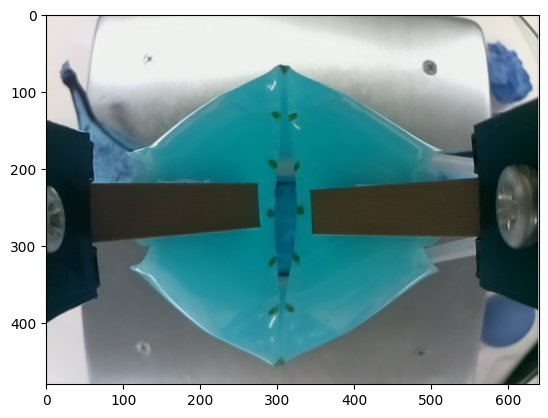

b'028.7,070.1,0419.3,0418.8\r\n'
Data number 19
['028.7', '070.1', '0419.3', '0418.8']
b'024.8,064.8,0556.8,0309.9\r\n'
['024.8', '064.8', '0556.8', '0309.9']
Enter something: 
b'000.0,000.0,0360.4,0360.2\r\n'
[INFO] [1677532030.270185]: Image received...


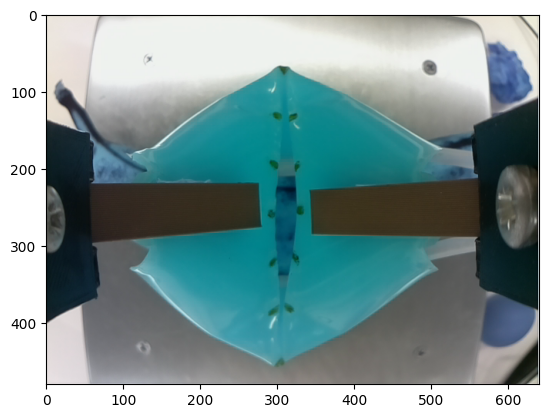

b'039.3,083.0,0411.1,0410.7\r\n'
Data number 20
['039.3', '083.0', '0411.1', '0410.7']
b'036.0,077.7,0549.9,0303.2\r\n'
['036.0', '077.7', '0549.9', '0303.2']
Enter something: 
b'000.0,000.0,0364.9,0364.6\r\n'
[INFO] [1677532042.269628]: Image received...


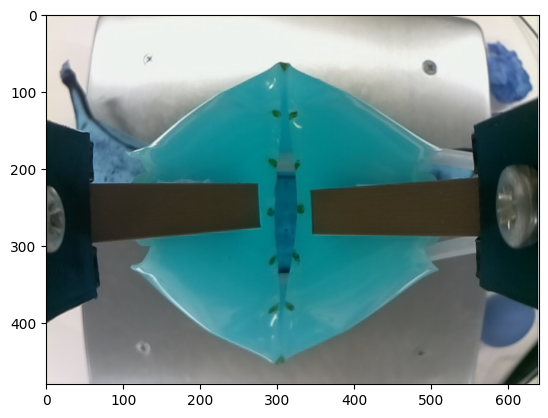

b'025.0,063.3,0421.5,0421.4\r\n'
Data number 21
['025.0', '063.3', '0421.5', '0421.4']
b'019.9,057.5,0559.5,0312.5\r\n'
['019.9', '057.5', '0559.5', '0312.5']
Enter something: 
b'000.0,000.0,0360.3,0361.6\r\n'
[INFO] [1677532054.024146]: Image received...


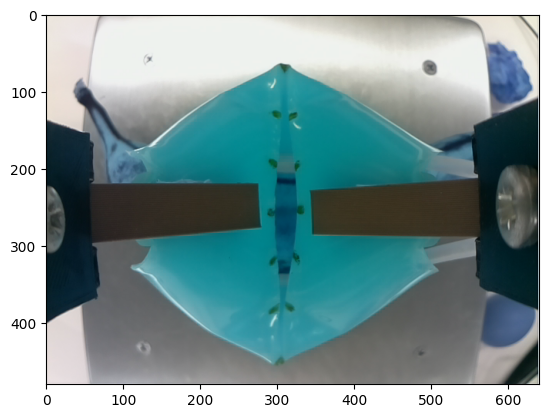

b'033.5,073.5,0419.2,0418.6\r\n'
Data number 22
['033.5', '073.5', '0419.2', '0418.6']
b'028.2,069.1,0555.8,0308.9\r\n'
['028.2', '069.1', '0555.8', '0308.9']
Enter something: 
b'000.0,000.0,0367.1,0367.3\r\n'
[INFO] [1677532066.526589]: Image received...


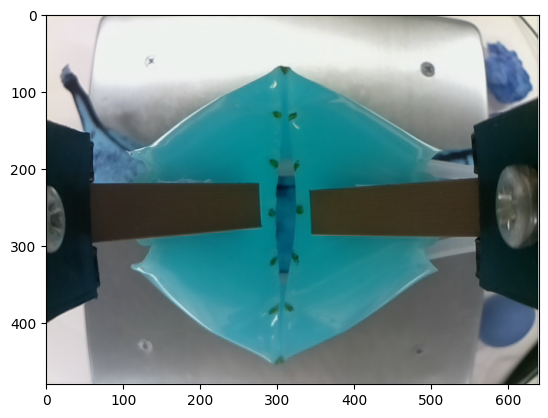

b'041.4,091.5,0400.1,0399.6\r\n'
Data number 23
['041.4', '091.5', '0400.1', '0399.6']
b'032.6,087.1,0539.8,0292.8\r\n'
['032.6', '087.1', '0539.8', '0292.8']
Enter something: 
b'000.0,000.0,0364.9,0364.8\r\n'
[INFO] [1677532078.526175]: Image received...


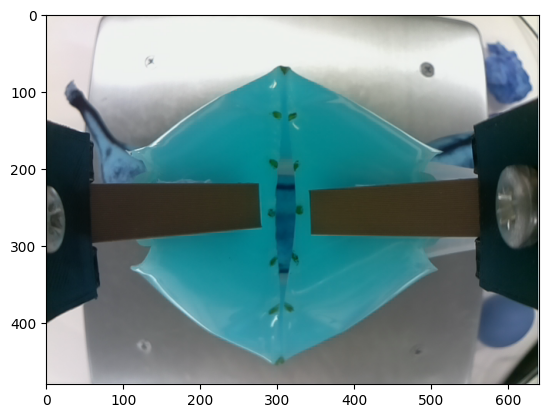

b'041.8,091.1,0401.2,0400.6\r\n'
Data number 24
['041.8', '091.1', '0401.2', '0400.6']
b'035.7,086.8,0540.2,0293.0\r\n'
['035.7', '086.8', '0540.2', '0293.0']
Enter something: 
b'000.0,000.0,0370.4,0370.3\r\n'
[INFO] [1677532092.770717]: Image received...


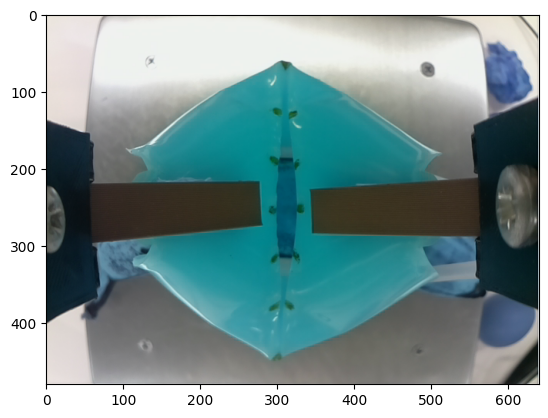

b'051.7,048.2,0408.2,0407.5\r\n'
Data number 25
['051.7', '048.2', '0408.2', '0407.5']
b'058.7,048.2,0536.7,0290.0\r\n'
['058.7', '048.2', '0536.7', '0290.0']
Enter something: 
b'000.0,000.0,0360.2,0358.4\r\n'
[INFO] [1677532104.517889]: Image received...


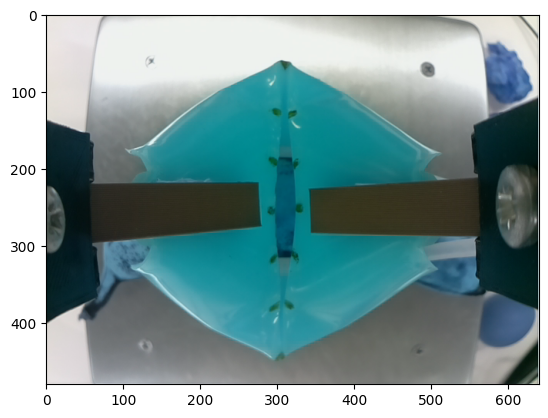

b'050.5,047.9,0412.5,0412.7\r\n'
Data number 26
['050.5', '047.9', '0412.5', '0412.7']
b'057.6,054.7,0539.1,0292.2\r\n'
['057.6', '054.7', '0539.1', '0292.2']
Enter something: 
b'000.0,000.0,0368.5,0368.4\r\n'
[INFO] [1677532118.030673]: Image received...


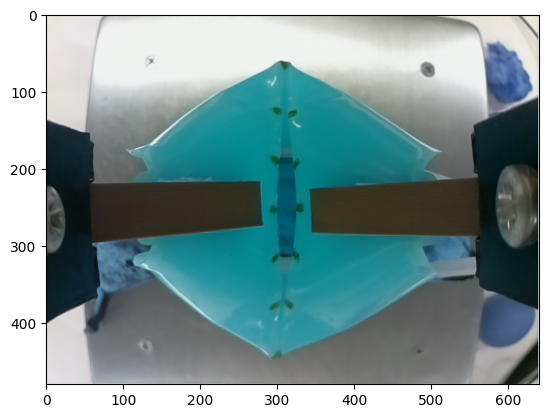

b'052.7,058.1,0393.9,0394.2\r\n'
Data number 27
['052.7', '058.1', '0393.9', '0394.2']
b'064.9,060.2,0523.9,0277.0\r\n'
['064.9', '060.2', '0523.9', '0277.0']
Enter something: 
b'000.0,000.0,0369.8,0369.6\r\n'
[INFO] [1677532132.768934]: Image received...


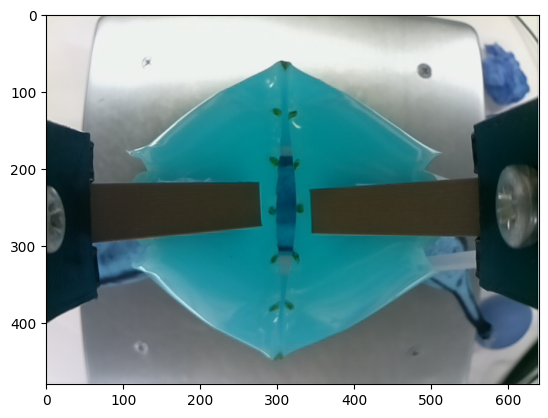

b'060.4,037.8,0405.9,0405.0\r\n'
Data number 28
['060.4', '037.8', '0405.9', '0405.0']
b'058.4,031.6,0543.7,0297.2\r\n'
['058.4', '031.6', '0543.7', '0297.2']
Enter something: 
b'000.0,000.0,0368.8,0368.6\r\n'
[INFO] [1677532146.519691]: Image received...


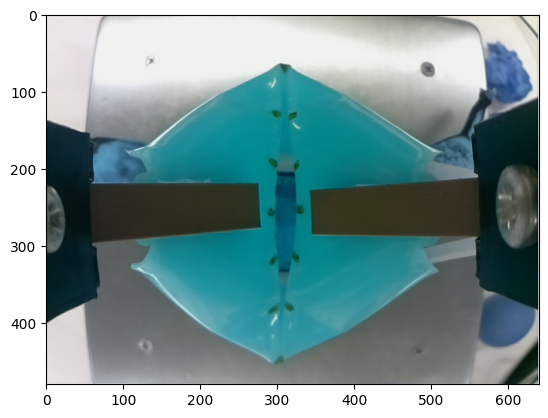

b'038.2,073.6,0412.7,0412.3\r\n'
Data number 29
['038.2', '073.6', '0412.7', '0412.3']
b'028.1,069.2,0552.0,0305.0\r\n'
['028.1', '069.2', '0552.0', '0305.0']
Enter something: 
b'000.0,000.0,0369.8,0369.8\r\n'
[INFO] [1677532160.514982]: Image received...


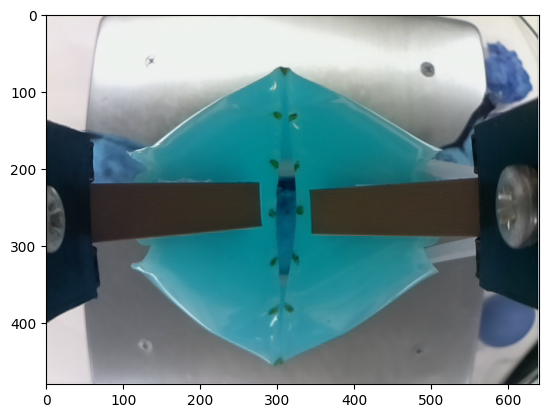

b'045.9,090.5,0401.6,0400.6\r\n'
Data number 30
['045.9', '090.5', '0401.6', '0400.6']
b'033.5,086.6,0540.8,0293.7\r\n'
['033.5', '086.6', '0540.8', '0293.7']
Enter something: 
b'000.0,000.0,0377.0,0377.3\r\n'
[INFO] [1677532231.780952]: Image received...


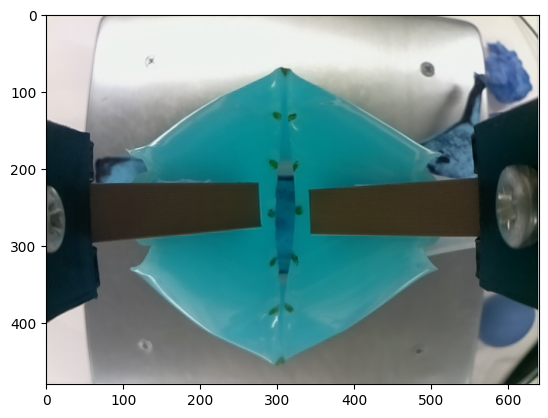

b'046.4,089.6,0399.3,0398.4\r\n'
Data number 31
['046.4', '089.6', '0399.3', '0398.4']
b'052.4,090.4,0530.9,0283.2\r\n'
['052.4', '090.4', '0530.9', '0283.2']
Enter something: 
b'000.0,000.0,0377.3,0377.3\r\n'
[INFO] [1677532335.262560]: Image received...


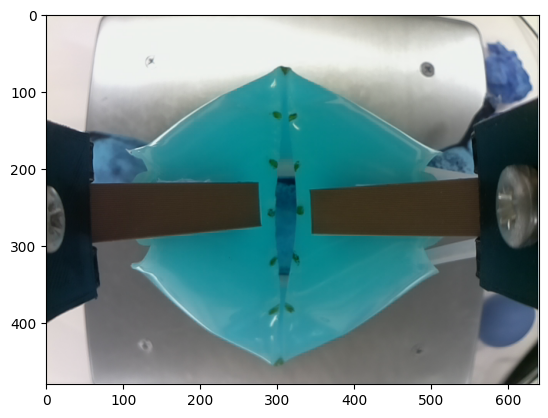

b'040.8,087.6,0411.1,0410.3\r\n'
Data number 32
['040.8', '087.6', '0411.1', '0410.3']
b'030.8,083.0,0549.7,0302.6\r\n'
['030.8', '083.0', '0549.7', '0302.6']
Enter something: 
b'000.0,000.0,0373.8,0373.8\r\n'
[INFO] [1677532351.519264]: Image received...


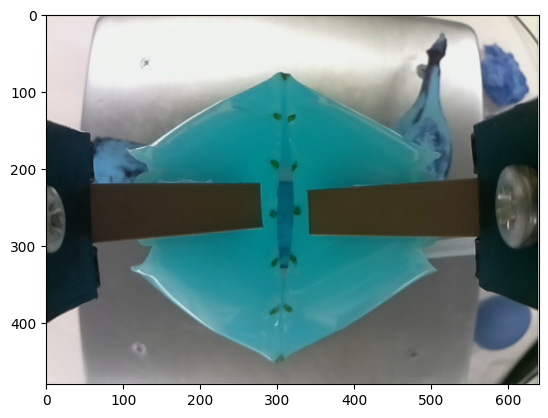

b'062.5,104.3,0365.3,0364.9\r\n'
Data number 33
['062.5', '104.3', '0365.3', '0364.9']
b'079.4,108.3,0476.8,0249.1\r\n'
['079.4', '108.3', '0476.8', '0249.1']
Enter something: 
b'000.0,000.0,0373.1,0373.2\r\n'
[INFO] [1677532365.772233]: Image received...


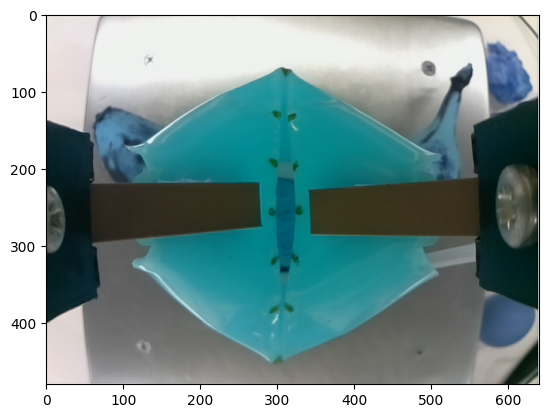

b'032.0,093.9,0390.3,0390.4\r\n'
Data number 34
['032.0', '093.9', '0390.3', '0390.4']
b'033.0,094.1,0515.5,0288.7\r\n'
['033.0', '094.1', '0515.5', '0288.7']
Enter something: 
b'000.0,000.0,0370.9,0370.9\r\n'
[INFO] [1677532379.266506]: Image received...


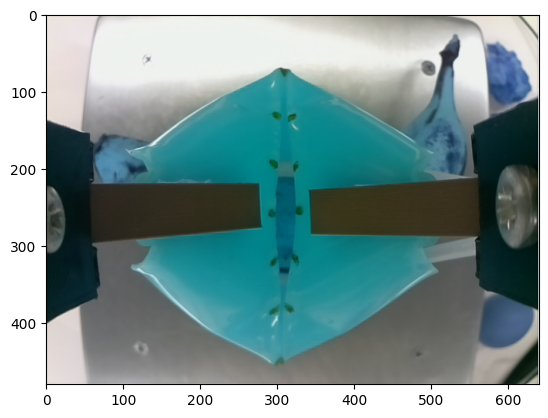

b'042.6,085.5,0395.2,0395.8\r\n'
Data number 35
['042.6', '085.5', '0395.2', '0395.8']
b'042.0,084.7,0522.6,0295.8\r\n'
['042.0', '084.7', '0522.6', '0295.8']
Enter something: 
b'000.0,000.0,0370.3,0370.4\r\n'
[INFO] [1677532392.748675]: Image received...


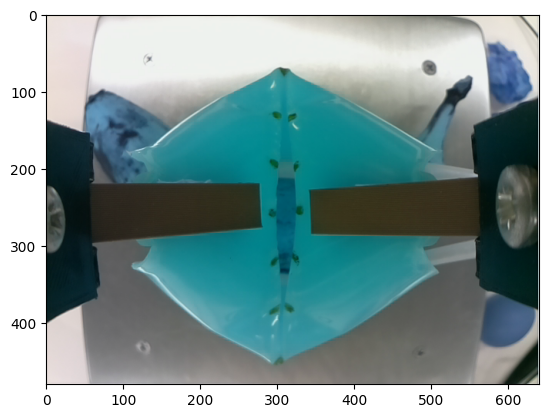

b'049.1,088.5,0396.5,0398.1\r\n'
Data number 36
['049.1', '088.5', '0396.5', '0398.1']
b'040.0,086.2,0523.5,0296.6\r\n'
['040.0', '086.2', '0523.5', '0296.6']
Enter something: 
b'000.0,000.0,0367.3,0367.4\r\n'
[INFO] [1677532405.267892]: Image received...


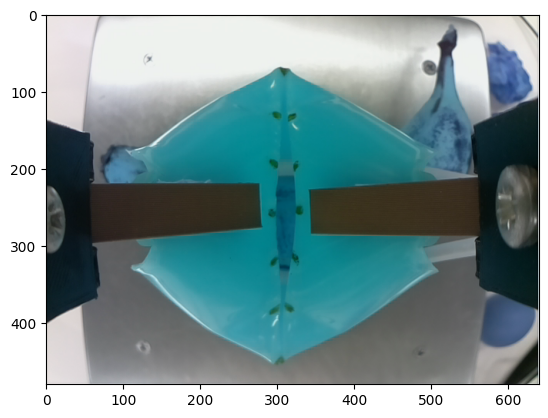

b'040.2,078.5,0395.6,0394.8\r\n'
Data number 37
['040.2', '078.5', '0395.6', '0394.8']
b'039.0,076.9,0521.0,0294.1\r\n'
['039.0', '076.9', '0521.0', '0294.1']
Enter something: 
b'000.0,000.0,0370.0,0370.0\r\n'
[INFO] [1677532418.760188]: Image received...


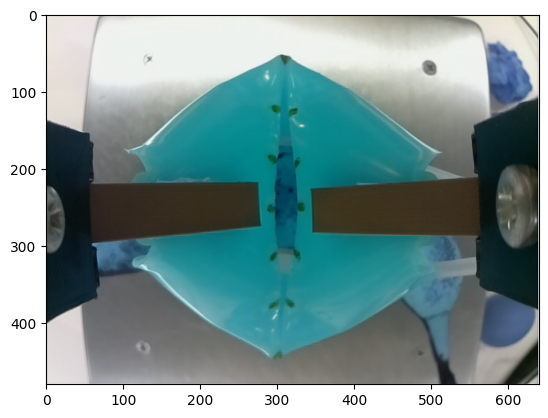

b'049.4,020.6,0430.1,0429.9\r\n'
Data number 38
['049.4', '020.6', '0430.1', '0429.9']
b'046.9,014.9,0554.8,0328.7\r\n'
['046.9', '014.9', '0554.8', '0328.7']
Enter something: 
b'000.0,000.0,0363.4,0363.3\r\n'
[INFO] [1677532430.749727]: Image received...


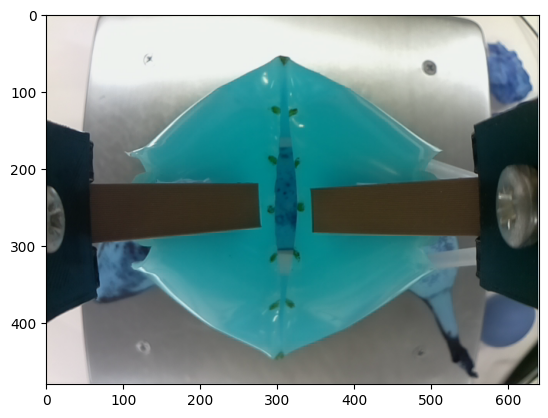

b'047.2,034.2,0431.0,0430.7\r\n'
Data number 39
['047.2', '034.2', '0431.0', '0430.7']
b'046.7,026.3,0553.3,0326.9\r\n'
['046.7', '026.3', '0553.3', '0326.9']
Enter something: 
b'000.0,000.0,0362.5,0362.3\r\n'
[INFO] [1677532442.513477]: Image received...


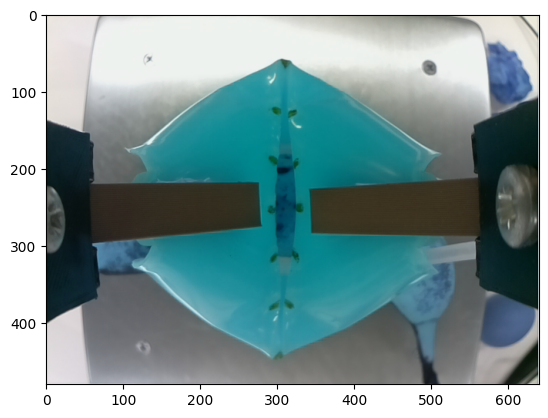

b'055.1,045.3,0413.8,0413.4\r\n'
Data number 40
['055.1', '045.3', '0413.8', '0413.4']
b'058.5,057.7,0529.1,0302.6\r\n'
['058.5', '057.7', '0529.1', '0302.6']
Enter something: 
b'000.0,000.0,0368.3,0368.2\r\n'
[INFO] [1677532457.266481]: Image received...


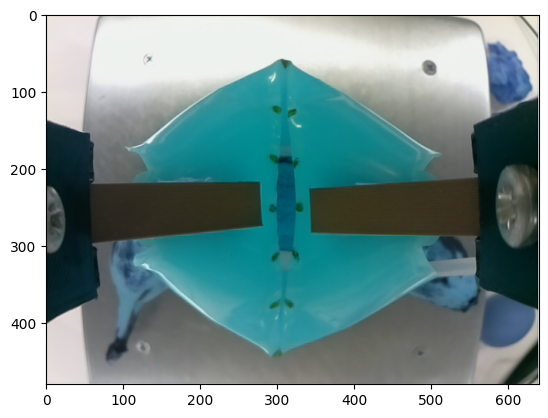

b'052.8,044.3,0393.2,0392.2\r\n'
Data number 41
['052.8', '044.3', '0393.2', '0392.2']
b'051.8,036.3,0518.9,0292.6\r\n'
['051.8', '036.3', '0518.9', '0292.6']
Enter something: 
b'000.0,000.0,0360.8,0356.9\r\n'
[INFO] [1677532469.021003]: Image received...


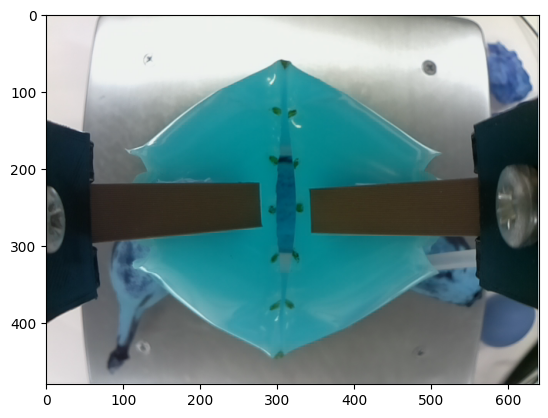

b'050.6,038.8,0401.0,0399.6\r\n'
Data number 42
['050.6', '038.8', '0401.0', '0399.6']
b'049.0,033.3,0526.4,0299.8\r\n'
['049.0', '033.3', '0526.4', '0299.8']
Enter something: 
b'000.0,000.0,0367.6,0367.7\r\n'
[INFO] [1677532483.020150]: Image received...


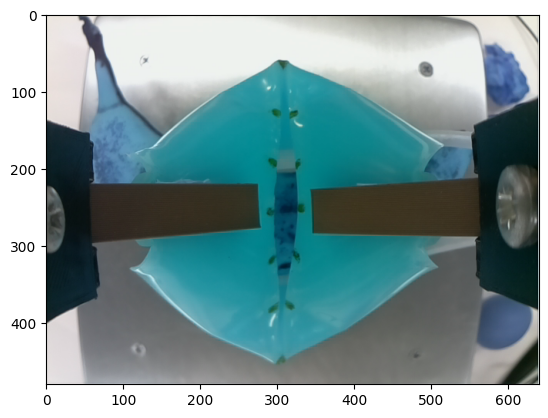

b'014.0,059.3,0434.1,0434.1\r\n'
Data number 43
['014.0', '059.3', '0434.1', '0434.1']
b'006.8,051.1,0557.4,0330.6\r\n'
['006.8', '051.1', '0557.4', '0330.6']
Enter something: 
b'000.0,000.0,0362.2,0362.3\r\n'
[INFO] [1677532495.013576]: Image received...


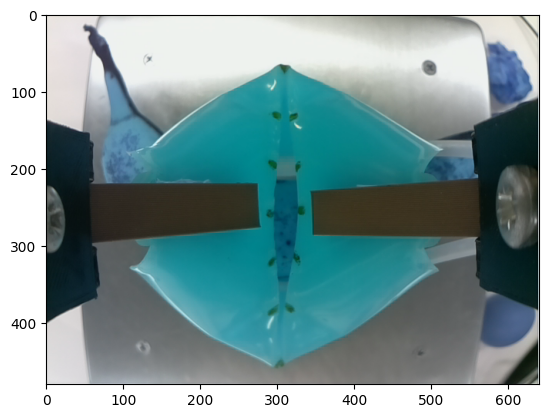

b'015.8,070.1,0431.3,0430.7\r\n'
Data number 44
['015.8', '070.1', '0431.3', '0430.7']
b'004.8,061.5,0555.5,0328.9\r\n'
['004.8', '061.5', '0555.5', '0328.9']
Enter something: 
b'000.0,000.0,0366.9,0366.7\r\n'
[INFO] [1677532508.255422]: Image received...


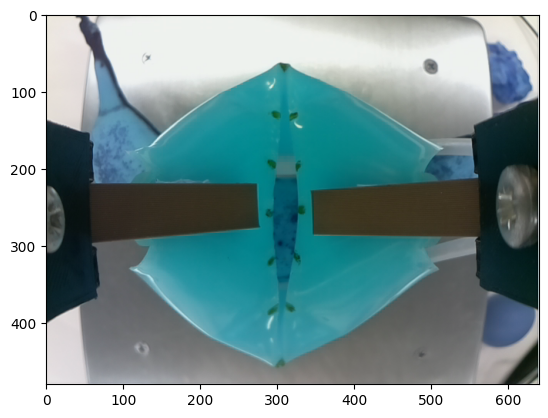

b'00-3.7,045.9,0437.2,0436.9\r\n'
Data number 45
['3.7', '045.9', '0437.2', '0436.9']
b'00-5.7,042.3,0557.5,0330.5\r\n'
['5.7', '042.3', '0557.5', '0330.5']
Enter something: 
b'000.0,000.0,0357.5,0359.8\r\n'
[INFO] [1677532520.013699]: Image received...


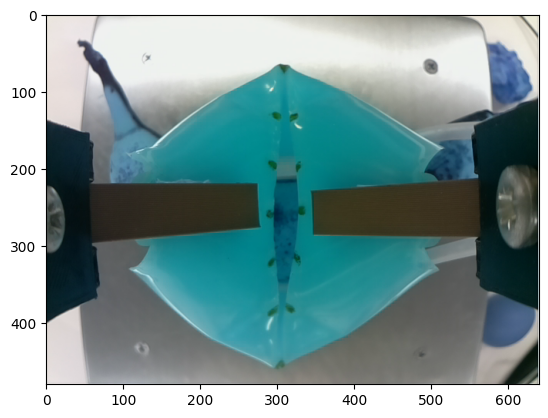

b'007.6,056.2,0435.0,0435.3\r\n'
Data number 46
['007.6', '056.2', '0435.0', '0435.3']
b'00-2.3,049.6,0558.6,0332.2\r\n'
['2.3', '049.6', '0558.6', '0332.2']
Enter something: 
b'000.0,000.0,0368.0,0368.0\r\n'
[INFO] [1677532533.768268]: Image received...


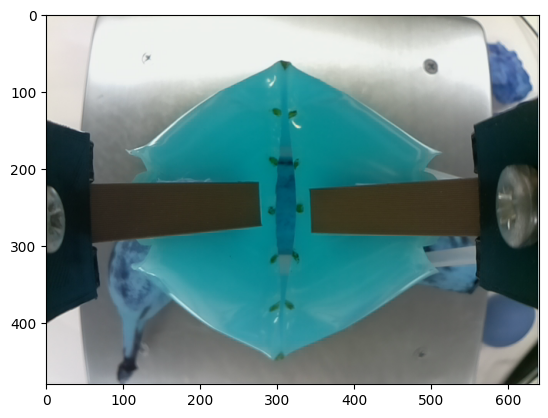

b'045.1,035.0,0406.4,0405.6\r\n'
Data number 47
['045.1', '035.0', '0406.4', '0405.6']
b'043.2,029.2,0530.3,0303.6\r\n'
['043.2', '029.2', '0530.3', '0303.6']
Enter something: 
b'000.0,000.0,0367.8,0367.6\r\n'
[INFO] [1677532547.512415]: Image received...


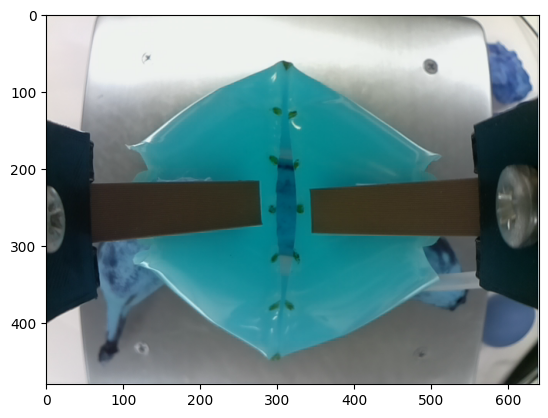

b'043.5,041.8,0400.4,0399.8\r\n'
Data number 48
['043.5', '041.8', '0400.4', '0399.8']
b'045.3,036.4,0523.2,0297.0\r\n'
['045.3', '036.4', '0523.2', '0297.0']
Enter something: 
b'000.0,000.0,0369.4,0369.3\r\n'
[INFO] [1677532562.764642]: Image received...


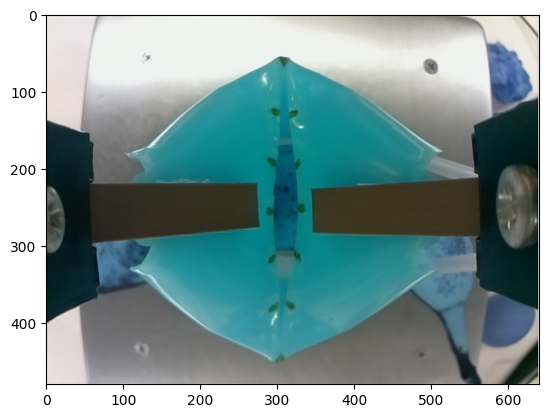

b'027.9,007.3,0440.4,0439.9\r\n'
Data number 49
['027.9', '007.3', '0440.4', '0439.9']
b'024.6,005.1,0559.7,0332.9\r\n'
['024.6', '005.1', '0559.7', '0332.9']
Enter something: 
b'000.0,000.0,0368.1,0368.0\r\n'
[INFO] [1677532577.760791]: Image received...


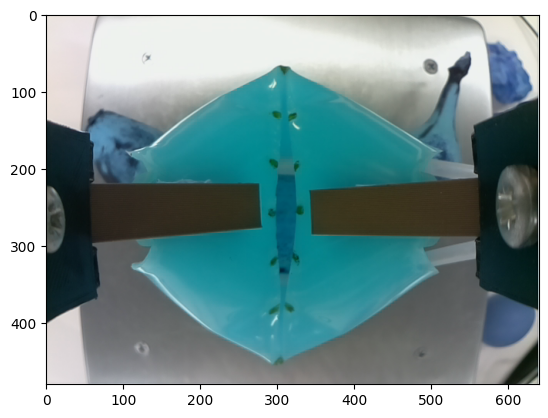

b'041.8,080.0,0404.8,0404.1\r\n'
Data number 50
['041.8', '080.0', '0404.8', '0404.1']
b'035.2,076.5,0530.9,0303.8\r\n'
['035.2', '076.5', '0530.9', '0303.8']
Enter something: 
b'000.0,000.0,0362.9,0362.4\r\n'
[INFO] [1677532589.764038]: Image received...


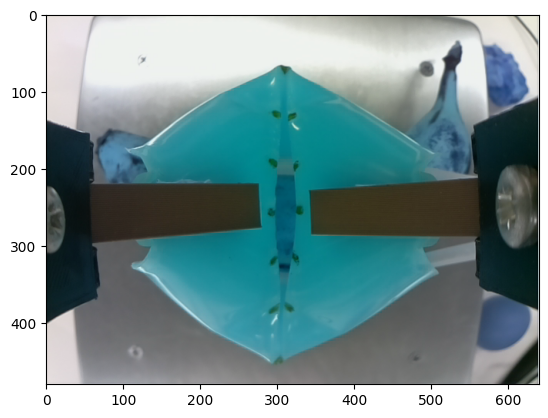

b'030.4,073.9,0402.7,0402.4\r\n'
Data number 51
['030.4', '073.9', '0402.7', '0402.4']
b'025.9,070.7,0529.3,0302.4\r\n'
['025.9', '070.7', '0529.3', '0302.4']


In [5]:
class Nodo(object):
    def __init__(self, dxl_motor):
        
        self.state = 0
        
        self.input_thread = threading.Thread(target=self.get_input)
        self.input_thread.daemon = True
        self.input_thread.start()
        
        self.image_array = []
        self.pressure_reading_1 = []
        self.pressure_reading_2 = []
        self.force_reading_1 = []
        self.force_reading_2 = []
        self.weight_reading_1 = []
        self.weight_reading_2 = []
        
        self.command = '0'
        self.take_photo = '0'
        self.dxl_motor = dxl_motor
        self.initialise_motor()
        
        self.ser = serial.Serial('/dev/ttyACM0', 57600, timeout=1)
        self.initialise_arduino()
        
        self.br = CvBridge()

        self.loop_rate = rospy.Rate(4)

        # Publishers
        self.pub = rospy.Publisher('number_command', Float64, queue_size=10)

        # Subscribers
        rospy.Subscriber("/image_capture",Image,self.callback)
    
    def initialise_arduino(self):
        time.sleep(2) # wait for the arduino to initialise
        self.ser.read(200) # clear the serial buffer
    
    def untare_read_arduino(self):
        # 0: clear tare and read, 1: tare and read, 2: read
        self.ser.write(b'0')
        time.sleep(0.1)
        return self.ser.read(40)
    
    def tare_read_arduino(self):
        # 0: clear tare and read, 1: tare and read, 2: read
        self.ser.write(b'1')
        time.sleep(0.1)
        return self.ser.read(40)
    
    def read_arduino(self):
        # 0: clear tare and read, 1: tare and read, 2: read
        self.ser.write(b'2')
        time.sleep(0.1)
        return self.ser.read(40)
    
    def initialise_motor(self):
        self.dxl_motor.set_current_position_mode()
        self.dxl_motor.read_operation_mode()
        self.dxl_motor.set_goal_current(50)
        
    def move_jaw(self, position):
        self.dxl_motor.torque_enable()
#         print(f"current position is {self.dxl_motor.read_present_position()}")
        self.dxl_motor.set_goal_position(position)
    
    def disable_jaw(self):
        self.dxl_motor.torque_disable()
    
    def get_input(self):
        while True:
            self.command = input("Enter something: ")
            time.sleep(1)
    
    def callback(self, msg):
        rospy.loginfo('Image received...')
        self.image = self.br.imgmsg_to_cv2(msg)
        self.image_array.append(self.image)
        plt.imshow(self.image)
        plt.show()
    
    def store_arduino_data(self, data):
        text = re.findall('\d+\.\d+', data.decode("utf-8"))
        print(text)
        self.pressure_reading_1.append(float(text[0]))
        self.pressure_reading_2.append(float(text[1]))
        self.force_reading_1.append(float(text[2]))
        self.force_reading_2.append(float(text[3]))
    
    def store_arduino_data_weight(self, data):
        text = re.findall('\d+\.\d+', data.decode("utf-8"))
        print(text)
        self.weight_reading_1.append(float(text[2]))
        self.weight_reading_2.append(float(text[3]))
    
    def save_data(self):
        image_name = []
        directory = './Grasp_dataset_5/Grasp_dataset_banana/'
        
        start_number = 0
        
        for i in range(0, len(self.image_array)):
            image_name.append('Banimage' + str(i+start_number).zfill(3) + '.jpg')
            cv2.imwrite(directory +'Banimage' + str(i+start_number).zfill(3) + '.jpg', my_node.image_array[i])
        
        header = ['image_name', 'weight_reading_1', 'weight_reading_2', 'pressure_reading_1', 'pressure_reading_2', 'force_reading_1', 'force_reading_2', 'label']
        grasp_df = pd.concat([pd.Series(image_name), pd.Series(self.weight_reading_1), pd.Series(self.weight_reading_2), pd.Series(self.pressure_reading_1), pd.Series(self.pressure_reading_2), pd.Series(self.force_reading_1), pd.Series(self.force_reading_2), pd.Series(np.repeat('banana', len(self.image_array)))], axis=1, keys=header)
        
        combined_df_set = pd.read_csv(directory + 'Grasp_dataset_banana.csv')
        
        combined_df_set = pd.concat([combined_df_set, grasp_df], axis=0)
        
        combined_df_set.to_csv(directory + 'Grasp_dataset_banana.csv', index=False)
        
    def start(self):
        
        time.sleep(1)
        self.move_jaw(0)
        time.sleep(2)
        print("Taring load cell...")
        self.tare_read_arduino()
        time.sleep(0.5)
        self.move_jaw(200)
            
        rospy.loginfo("Timing images")

        while not rospy.is_shutdown():
            
            if self.command == '':
                self.command = '0'
                print(self.untare_read_arduino())
                time.sleep(0.5)
                self.move_jaw(1900)
                time.sleep(1.6)
                self.pub.publish(5201314)
                data = self.read_arduino()
                print(data)
                print('Data number ' + str(len(self.image_array)))
                self.store_arduino_data(data)
                time.sleep(0.5)

                time.sleep(1.9)
                self.pub.publish(1314)
                data = self.read_arduino()
                print(data)
                self.store_arduino_data_weight(data)
                time.sleep(2.8)
                self.move_jaw(200)

            elif self.command == '3':
                self.disable_jaw()
        
            self.loop_rate.sleep()

if __name__ == '__main__':
    rospy.init_node("command_publisher", anonymous=True)
    dxl_motor = Dynamixel_motor(1, 57600, '/dev/ttyUSB0')
    my_node = Nodo(dxl_motor)
    my_node.start()

In [6]:
my_node.save_data()